<a href="https://colab.research.google.com/github/sudarshanmungi39/Individual-project---Image-segmentation/blob/main/Image%20Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [39]:
# Import libraries and setup path

!pip install pycocotools -q

import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import functional as F
import torchvision

from torchvision.models.detection import maskrcnn_resnet50_fpn
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils

torch.backends.cudnn.benchmark = True

print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# path
from google.colab import drive
drive.mount('/content/drive')

BASE_DIR = "/content/drive/MyDrive/RMDS_Segmentation_Assignment"

TRAIN_DIR = f"{BASE_DIR}/train-300"
VAL_DIR   = f"{BASE_DIR}/validation-300"
TEST_DIR  = f"{BASE_DIR}/test-30"

TRAIN_IMG_DIR = os.path.join(TRAIN_DIR, "data")
VAL_IMG_DIR   = os.path.join(VAL_DIR, "data")

train_ann_path = os.path.join(TRAIN_DIR, "labels.json")
val_ann_path   = os.path.join(VAL_DIR, "labels.json")

print("Train:", TRAIN_DIR)
print("Val:  ", VAL_DIR)
print("Test: ", TEST_DIR)
print("Train ann:", train_ann_path)
print("Val ann:  ", val_ann_path)

Torch version: 2.9.0+cu126
CUDA available: True
Using device: cuda
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train: /content/drive/MyDrive/RMDS_Segmentation_Assignment/train-300
Val:   /content/drive/MyDrive/RMDS_Segmentation_Assignment/validation-300
Test:  /content/drive/MyDrive/RMDS_Segmentation_Assignment/test-30
Train ann: /content/drive/MyDrive/RMDS_Segmentation_Assignment/train-300/labels.json
Val ann:   /content/drive/MyDrive/RMDS_Segmentation_Assignment/validation-300/labels.json


In [40]:
# COCO category IDs for the assignment
ALLOWED_CATS = {
    "person": 1,
    "cat": 17,
    "sports ball": 37,
    "book": 84,
}
allowed_cat_ids = set(ALLOWED_CATS.values())

NUM_CLASSES = 5  # background + 4 classes
TRAIN_ID_TO_NAME = {
    0: "background",
    1: "person",
    2: "cat",
    3: "sports ball",
    4: "book"
}

# COCO cat_id -> our train_id
catid_to_trainid = {
    ALLOWED_CATS["person"]: 1,
    ALLOWED_CATS["cat"]: 2,
    ALLOWED_CATS["sports ball"]: 3,
    ALLOWED_CATS["book"]: 4
}

# Load COCO annotations via pycocotools
train_coco = COCO(train_ann_path)
val_coco   = COCO(val_ann_path)

print("Train images total:", len(train_coco.imgs))
print("Val images total:  ", len(val_coco.imgs))

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Train images total: 300
Val images total:   300


loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Train images total: 300
Val images total:   300
Instance counts (train, 4 classes): Counter({'person': 1137, 'book': 128, 'cat': 27, 'sports ball': 18})


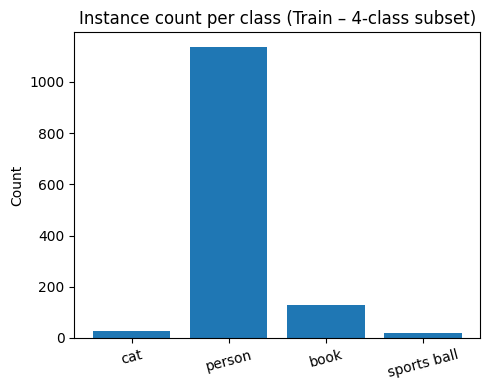

In [41]:
from collections import Counter

# Load COCO annotations via pycocotools
train_coco = COCO(train_ann_path)
val_coco   = COCO(val_ann_path)

print("Train images total:", len(train_coco.imgs))
print("Val images total:  ", len(val_coco.imgs))

# EDA: instance counts per class (4-class subset)

id_to_name = {cat_id: cat["name"] for cat_id, cat in train_coco.cats.items()}
class_counts = Counter()

for ann in train_coco.anns.values():
    cid = ann["category_id"]
    if cid in allowed_cat_ids:
        class_counts[id_to_name[cid]] += 1

print("Instance counts (train, 4 classes):", class_counts)

plt.figure(figsize=(5,4))
plt.bar(class_counts.keys(), class_counts.values())
plt.title("Instance count per class (Train – 4-class subset)")
plt.ylabel("Count")
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()

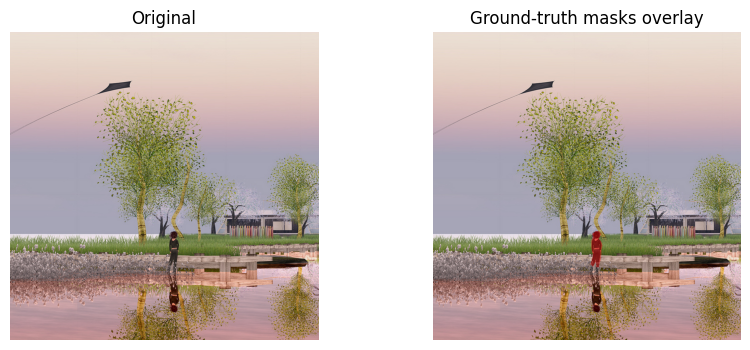

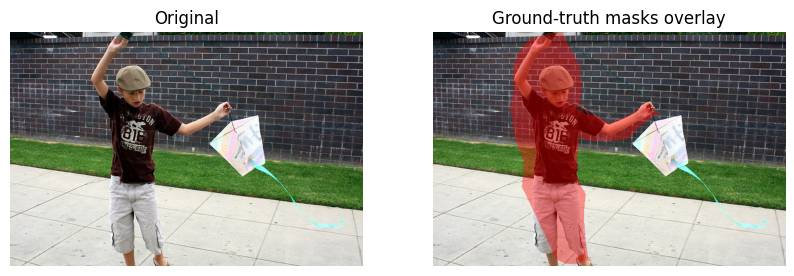

In [42]:
import random
from PIL import ImageDraw

# EDA: visualise a couple of ground-truth masks

def show_gt_masks_coco(coco, img_dir, allowed_cat_ids, num_samples=2):
    img_ids = list(coco.imgs.keys())
    random.shuffle(img_ids)
    img_ids = img_ids[:num_samples]

    colours = {
        1: (255,   0,   0, 100),
        17:(  0, 255,   0, 100),
        37:(  0,   0, 255, 100),
        84:(255, 255,   0, 100),
    }

    for img_id in img_ids:
        info = coco.loadImgs([img_id])[0]
        img_path = os.path.join(img_dir, info["file_name"])
        image = Image.open(img_path).convert("RGB")

        ann_ids = coco.getAnnIds(imgIds=[img_id], catIds=list(allowed_cat_ids))
        anns = coco.loadAnns(ann_ids)

        mask_layer = Image.new("RGBA", image.size, (0, 0, 0, 0))
        draw = ImageDraw.Draw(mask_layer, "RGBA")

        for ann in anns:
            cid = ann["category_id"]
            color = colours.get(cid, (255, 255, 255, 80))
            for seg in ann["segmentation"]:
                poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                draw.polygon(poly, outline=color, fill=color)

        overlay = Image.alpha_composite(image.convert("RGBA"), mask_layer)

        plt.figure(figsize=(10,4))
        plt.subplot(1,2,1)
        plt.imshow(image)
        plt.axis("off")
        plt.title("Original")

        plt.subplot(1,2,2)
        plt.imshow(overlay)
        plt.axis("off")
        plt.title("Ground-truth masks overlay")
        plt.show()

show_gt_masks_coco(train_coco, TRAIN_IMG_DIR, allowed_cat_ids, num_samples=2)

In [43]:
# Pre-processing tool: COCOMaskRCNNDataset

class COCOMaskRCNNDataset(Dataset):
    def __init__(self, coco, img_dir, allowed_cat_ids, catid_to_trainid, transforms=None):
        self.coco = coco
        self.img_dir = img_dir
        self.allowed_cat_ids = set(allowed_cat_ids)
        self.catid_to_trainid = catid_to_trainid
        self.transforms = transforms

        # Keep only images with at least one allowed category
        self.img_ids = []
        for img_id in self.coco.getImgIds():
            ann_ids = self.coco.getAnnIds(
                imgIds=[img_id],
                catIds=list(self.allowed_cat_ids),
                iscrowd=None
            )
            if len(ann_ids) > 0:
                self.img_ids.append(img_id)

        print(f"Dataset at {img_dir}: {len(self.img_ids)} images with target objects.")

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs([img_id])[0]
        file_name = img_info["file_name"]
        img_path = os.path.join(self.img_dir, file_name)

        # Image
        image = Image.open(img_path).convert("RGB")
        image_tensor = F.to_tensor(image)  # (3, H, W)

        # Annotations
        ann_ids = self.coco.getAnnIds(
            imgIds=[img_id],
            catIds=list(self.allowed_cat_ids),
            iscrowd=None
        )
        anns = self.coco.loadAnns(ann_ids)

        boxes = []
        labels = []
        masks = []
        areas = []

        height = img_info["height"]
        width  = img_info["width"]

        for ann in anns:
            cid = ann["category_id"]
            if cid not in self.catid_to_trainid:
                continue
            label = self.catid_to_trainid[cid]

            # Decode mask (works for polygons + RLE)
            rle = self.coco.annToRLE(ann)
            mask = maskUtils.decode(rle)  # (H,W) or (H,W,1)
            if mask.ndim == 3:
                mask = mask[:, :, 0]
            mask = mask.astype(np.uint8)

            if mask.sum() == 0:
                continue

            # COCO bbox: [x, y, w, h]  ->  [x1, y1, x2, y2]
            x, y, w, h = ann["bbox"]
            x1 = x
            y1 = y
            x2 = x + w
            y2 = y + h

            # Clamp to image bounds
            x1 = max(0, min(x1, width - 1))
            y1 = max(0, min(y1, height - 1))
            x2 = max(0, min(x2, width))
            y2 = max(0, min(y2, height))

            if x2 <= x1 or y2 <= y1:
                continue

            boxes.append([x1, y1, x2, y2])
            labels.append(label)
            masks.append(mask)
            areas.append((x2 - x1) * (y2 - y1))

        if len(boxes) == 0:
            boxes  = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,),   dtype=torch.int64)
            masks  = torch.zeros((0, height, width), dtype=torch.uint8)
            areas  = torch.zeros((0,),   dtype=torch.float32)
        else:
            boxes  = torch.as_tensor(np.array(boxes), dtype=torch.float32)
            labels = torch.as_tensor(np.array(labels), dtype=torch.int64)
            masks  = torch.as_tensor(np.stack(masks, axis=0), dtype=torch.uint8)
            areas  = torch.as_tensor(np.array(areas), dtype=torch.float32)

        iscrowd = torch.zeros((labels.shape[0],), dtype=torch.int64)
        image_id = torch.tensor([img_id], dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": masks,
            "image_id": image_id,
            "area": areas,
            "iscrowd": iscrowd,
        }

        if self.transforms is not None:
            image_tensor, target = self.transforms(image_tensor, target)

        return image_tensor, target
        return image_tensor, target

def collate_fn_det(batch):
    return tuple(zip(*batch))

In [44]:
#  Create DataLoaders

BATCH_SIZE = 2

train_dataset_det = COCOMaskRCNNDataset(
    coco=train_coco,
    img_dir=TRAIN_IMG_DIR,
    allowed_cat_ids=allowed_cat_ids,
    catid_to_trainid=catid_to_trainid,
    transforms=None
)

val_dataset_det = COCOMaskRCNNDataset(
    coco=val_coco,
    img_dir=VAL_IMG_DIR,
    allowed_cat_ids=allowed_cat_ids,
    catid_to_trainid=catid_to_trainid,
    transforms=None
)

train_loader_det = DataLoader(
    train_dataset_det,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,          # keep 0 to avoid worker errors
    collate_fn=collate_fn_det,
    pin_memory=True
)

val_loader_det = DataLoader(
    val_dataset_det,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn_det,
    pin_memory=True
)

print("Train batches:", len(train_loader_det))
print("Val batches:  ", len(val_loader_det))

Dataset at /content/drive/MyDrive/RMDS_Segmentation_Assignment/train-300/data: 300 images with target objects.
Dataset at /content/drive/MyDrive/RMDS_Segmentation_Assignment/validation-300/data: 300 images with target objects.
Train batches: 150
Val batches:   150


In [45]:
# Quick sanity check

img, target = train_dataset_det[0]
print("Image shape:", img.shape)
for k, v in target.items():
    if torch.is_tensor(v):
        print(k, v.shape, v.dtype)
    else:
        print(k, v)

Image shape: torch.Size([3, 480, 640])
boxes torch.Size([10, 4]) torch.float32
labels torch.Size([10]) torch.int64
masks torch.Size([10, 480, 640]) torch.uint8
image_id torch.Size([1]) torch.int64
area torch.Size([10]) torch.float32
iscrowd torch.Size([10]) torch.int64


In [46]:
# Mask R-CNN model & custom heads

# Load Mask R-CNN and adapt to 4 classes

# Try new API first, fall back if needed
try:
    model = maskrcnn_resnet50_fpn(weights="DEFAULT")
except TypeError:
    model = maskrcnn_resnet50_fpn(pretrained=True)

# Replace box head
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
    in_features,
    NUM_CLASSES
)

# Replace mask head
in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256
model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
    in_features_mask,
    hidden_layer,
    NUM_CLASSES
)

model.to(device)
print("Mask R-CNN ready on", device)

# Optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

# Scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=5,
    gamma=0.1
)

print("Optimizer and Scheduler ready!")

Mask R-CNN ready on cuda
Optimizer and Scheduler ready!


In [47]:
# Training and validation loops

import time
import torch

def train_one_epoch_det(model, data_loader, optimizer, device):
    model.train()
    running_loss = 0.0
    count = 0

    for batch_idx, (images, targets) in enumerate(data_loader):
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # For detection models in TRAIN mode, this returns a dict of losses
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        batch_size = len(images)
        running_loss += losses.item() * batch_size
        count += batch_size

        # Progress print so you can see it's moving
        if batch_idx % 5 == 0:
            print(f"  [Train batch {batch_idx+1}/{len(data_loader)}] "
                  f"Loss: {losses.item():.4f}")

    avg_loss = running_loss / max(count, 1)
    return avg_loss


@torch.no_grad()
def validate_det(model, data_loader, device):
    model.train()  # still TRAIN mode to get loss dict
    running_loss = 0.0
    count = 0

    for batch_idx, (images, targets) in enumerate(data_loader):
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)   # returns dict
        losses = sum(loss for loss in loss_dict.values())

        batch_size = len(images)
        running_loss += losses.item() * batch_size
        count += batch_size

        if batch_idx % 10 == 0:
            print(f"  [Val batch {batch_idx+1}/{len(data_loader)}] "
                  f"Loss: {losses.item():.4f}")

    avg_loss = running_loss / max(count, 1)
    return avg_loss


# ===== Training loop =====
EPOCHS = 5  # you can change to 2–3 for speed

train_losses = []
val_losses = []

for epoch in range(1, EPOCHS + 1):
    print(f"\n===== Epoch {epoch:02d}/{EPOCHS} =====")
    start = time.time()

    train_loss = train_one_epoch_det(model, train_loader_det, optimizer, device)
    val_loss   = validate_det(model, val_loader_det, device)
    lr_scheduler.step()

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    elapsed = time.time() - start
    print(f"Epoch {epoch:02d}/{EPOCHS} | "
          f"Train Loss: {train_loss:.4f} | "
          f"Val Loss: {val_loss:.4f} | "
          f"Time: {elapsed:.1f}s")


===== Epoch 01/5 =====
  [Train batch 1/150] Loss: 3.6357
  [Train batch 6/150] Loss: 1.8213
  [Train batch 11/150] Loss: 2.0228
  [Train batch 16/150] Loss: 0.8591
  [Train batch 21/150] Loss: 0.9577
  [Train batch 26/150] Loss: 0.9980
  [Train batch 31/150] Loss: 1.0035
  [Train batch 36/150] Loss: 0.8188
  [Train batch 41/150] Loss: 1.0435
  [Train batch 46/150] Loss: 1.1681
  [Train batch 51/150] Loss: 2.1336
  [Train batch 56/150] Loss: 0.6070
  [Train batch 61/150] Loss: 0.7320
  [Train batch 66/150] Loss: 0.9690
  [Train batch 71/150] Loss: 1.5707
  [Train batch 76/150] Loss: 0.7483
  [Train batch 81/150] Loss: 0.7634
  [Train batch 86/150] Loss: 1.3451
  [Train batch 91/150] Loss: 0.8232
  [Train batch 96/150] Loss: 1.1238
  [Train batch 101/150] Loss: 0.7850
  [Train batch 106/150] Loss: 1.3320
  [Train batch 111/150] Loss: 0.8613
  [Train batch 116/150] Loss: 0.6188
  [Train batch 121/150] Loss: 0.7609
  [Train batch 126/150] Loss: 0.9648
  [Train batch 131/150] Loss: 0.6141

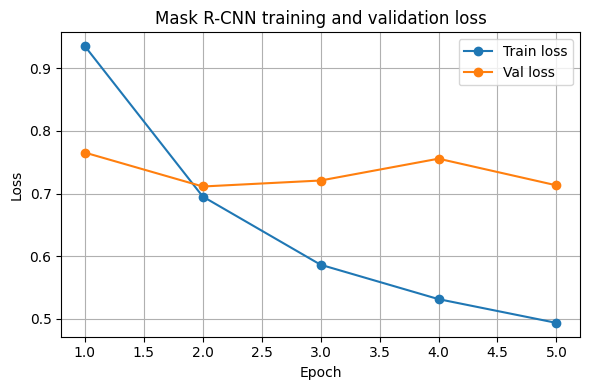

In [48]:
# Plot training and validation loss

epochs = range(1, EPOCHS + 1)

plt.figure(figsize=(6,4))
plt.plot(epochs, train_losses, marker="o", label="Train loss")
plt.plot(epochs, val_losses,   marker="o", label="Val loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Mask R-CNN training and validation loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("fig_loss_curves.png", dpi=120)
plt.show()

In [49]:
import os
import matplotlib.pyplot as plt
import numpy as np
import torch

@torch.no_grad()
def visualize_show_and_save(model, dataset, device, idx=0, score_thresh=0.5, save_path="prediction_output.png"):
    print(f"Running prediction for idx={idx}...")

    model.eval()

    # Load data
    img, target = dataset[idx]
    img_np = img.permute(1, 2, 0).cpu().numpy()

    # Forward pass
    output = model([img.to(device)])[0]
    print("Model forward pass done.")

    masks  = output["masks"].cpu().numpy()
    labels = output["labels"].cpu().numpy()
    scores = output["scores"].cpu().numpy()

    print(f"Detections: {len(masks)}")
    if len(scores) > 0:
        print("Scores:", scores[:5])

    # Prepare blended overlay
    overlay = img_np.copy()

    colours = {
        1: (1.0, 0.0, 0.0),  # red
        2: (0.0, 1.0, 0.0),  # green
        3: (0.0, 0.0, 1.0),  # blue
        4: (1.0, 1.0, 0.0),  # yellow
    }

    for m, lab, sc in zip(masks, labels, scores):
        if sc < score_thresh:
            continue

        m_bin = (m[0] > 0.5)
        color = colours.get(int(lab), (1.0, 1.0, 1.0))

        for c in range(3):
            overlay[:, :, c] = np.where(
                m_bin,
                0.7 * overlay[:, :, c] + 0.3 * color[c],
                overlay[:, :, c]
            )

    # Show + Save
    fig, ax = plt.subplots(1, 2, figsize=(13, 5))

    ax[0].imshow(img_np)
    ax[0].axis("off")
    ax[0].set_title("Original Image")

    ax[1].imshow(overlay)
    ax[1].axis("off")
    ax[1].set_title("Predicted Masks Overlay")

    plt.tight_layout()
    plt.savefig(save_path, dpi=120, bbox_inches="tight")
    plt.show()

    print(f"Saved output → {save_path}")

    visualize_show_and_save(model, val_dataset_det, device, idx=0, save_path="pred0.png")
    visualize_show_and_save(model, val_dataset_det, device, idx=10, save_path="pred10.png")
    visualize_show_and_save(model, val_dataset_det, device, idx=20, save_path="pred20.png")

    os.rename("pred0.png",  "fig_maskrcnn_family.png")
    os.rename("pred10.png", "fig_maskrcnn_man_tie.png")
    os.rename("pred20.png", "fig_maskrcnn_scooter.png")
    os.listdir()

Test images: 30
[0] 000000013177.jpg — detections: 5
Scores: [0.98557484 0.5083869  0.17620909 0.09691153 0.0549516 ]


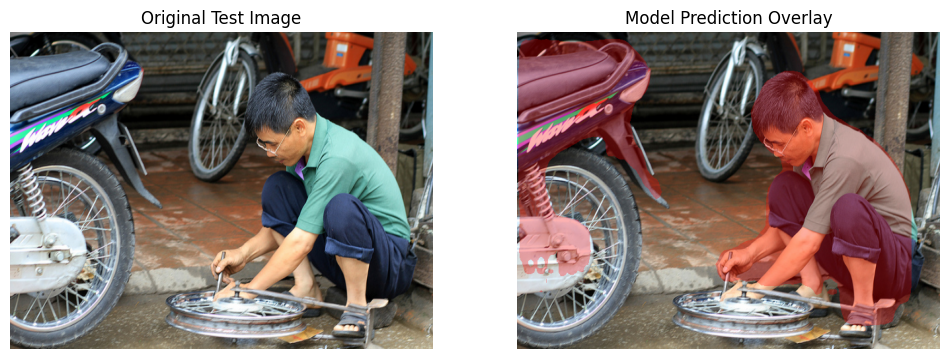

[5] 000000117525.jpg — detections: 6
Scores: [0.93113726 0.924037   0.32758904 0.16631852 0.0944636 ]


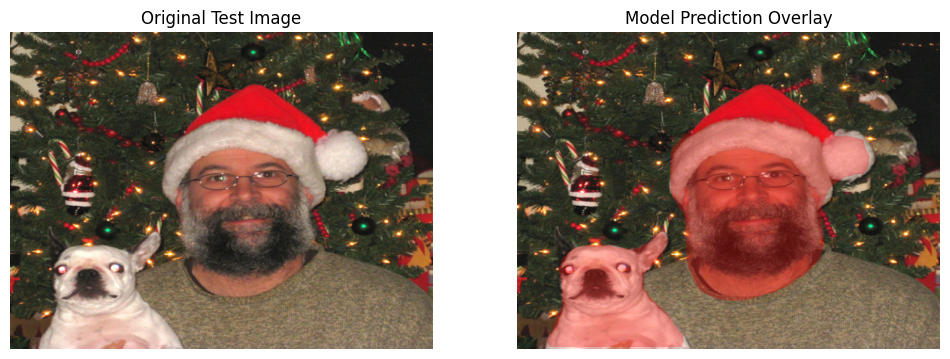

[12] 000000233771.jpg — detections: 24
Scores: [0.9914125  0.9891577  0.96199167 0.95289356 0.91013056]


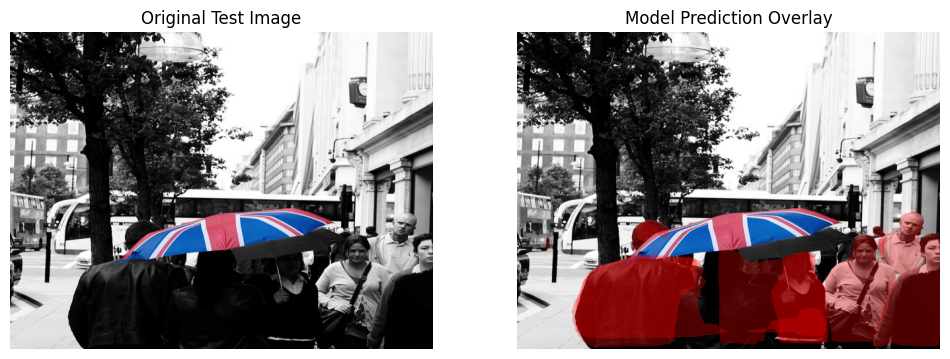

[0] 000000013177.jpg — detections: 5
Scores: [0.98557484 0.5083869  0.17620909 0.09691153 0.0549516 ]


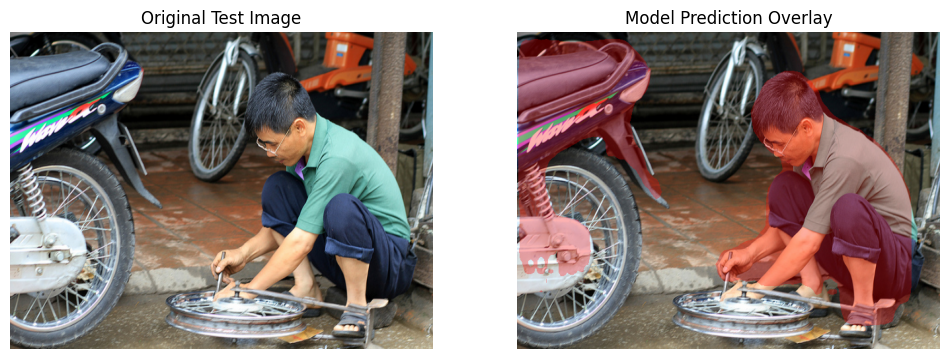

[1] 000000013291.jpg — detections: 22
Scores: [0.9935126  0.9911641  0.97800785 0.96584797 0.8958534 ]


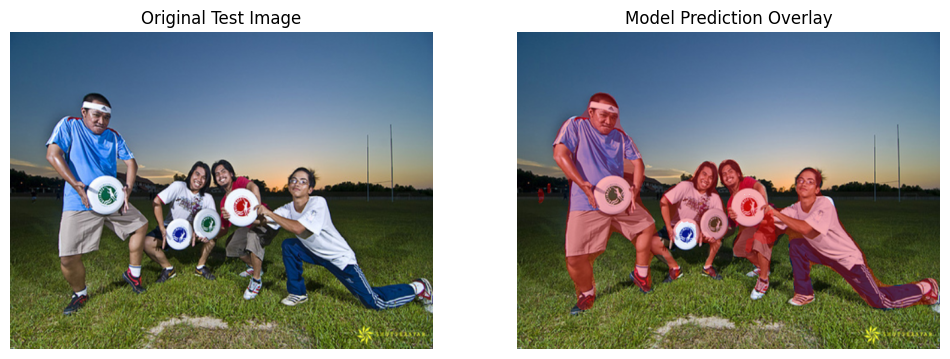

[2] 000000050380.jpg — detections: 13
Scores: [0.99065113 0.93587554 0.9194101  0.5383031  0.32422742]


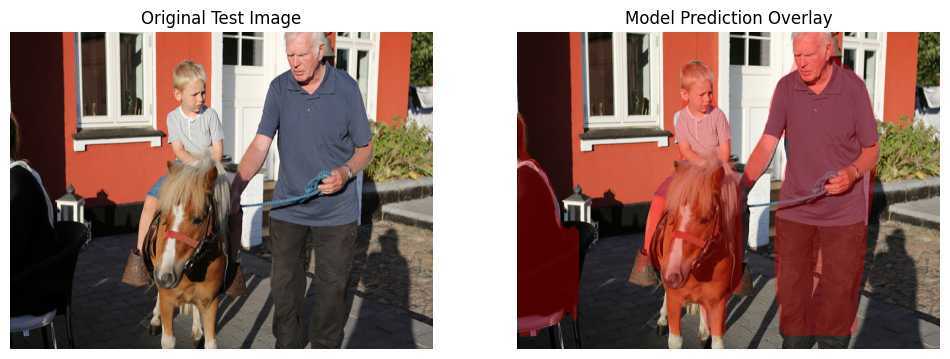

[3] 000000066771.jpg — detections: 4
Scores: [0.9923247  0.9840088  0.7772901  0.10826246]


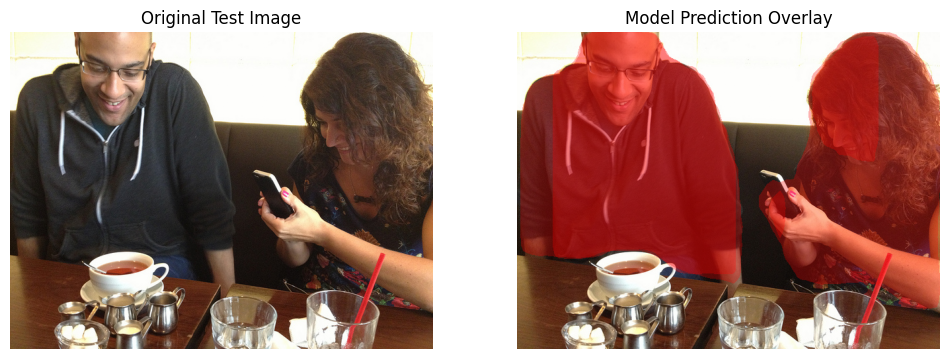

[4] 000000079969.jpg — detections: 90
Scores: [0.9849858  0.9809225  0.95838445 0.9349573  0.8674148 ]


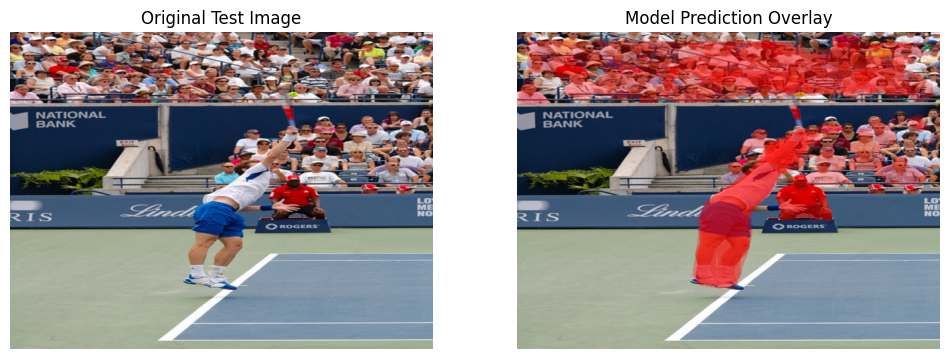

[5] 000000117525.jpg — detections: 6
Scores: [0.93113726 0.924037   0.32758904 0.16631852 0.0944636 ]


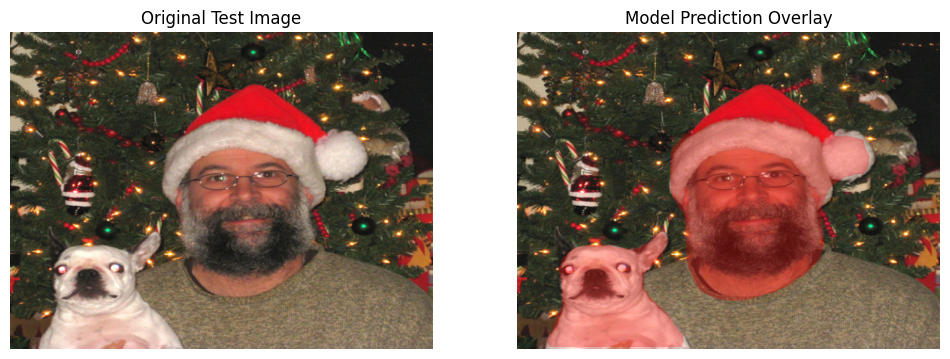

[6] 000000125850.jpg — detections: 3
Scores: [0.864506   0.27567247 0.18677875]


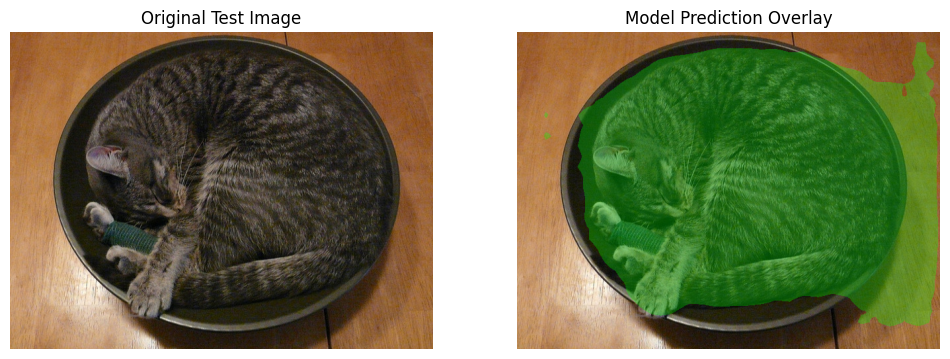

[7] 000000143556.jpg — detections: 10
Scores: [0.96077925 0.750258   0.2889456  0.26932725 0.20547801]


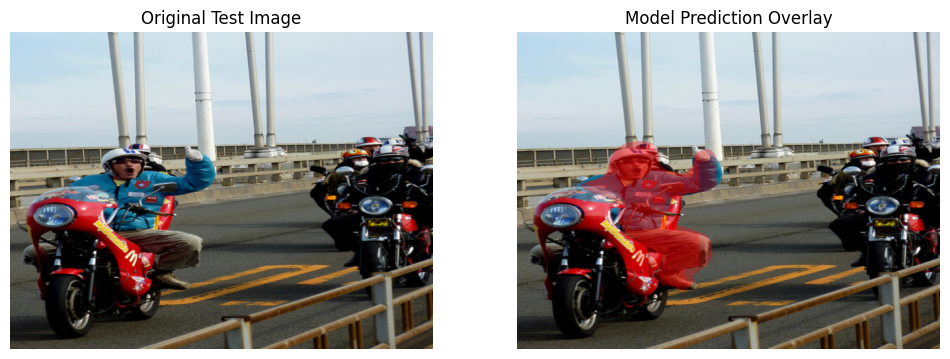

[8] 000000153011.jpg — detections: 28
Scores: [0.99263084 0.9913316  0.9911026  0.990732   0.98796797]


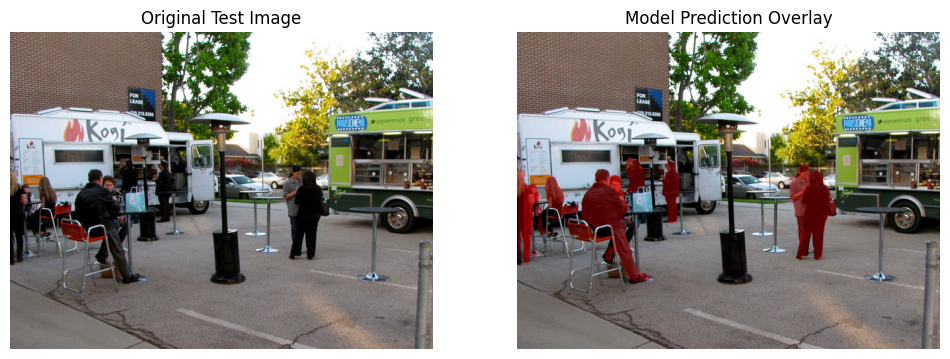

[9] 000000156292.jpg — detections: 17
Scores: [0.987277   0.9804998  0.97041714 0.94811994 0.79745406]


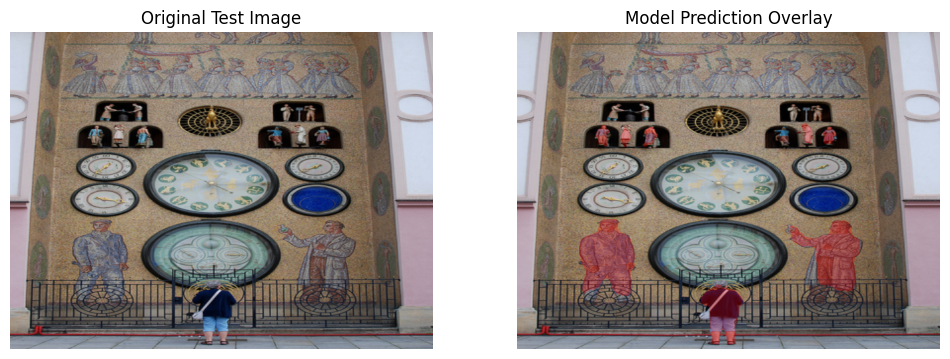

[10] 000000161032.jpg — detections: 11
Scores: [0.9770727  0.74432695 0.46695855 0.20722772 0.16950904]


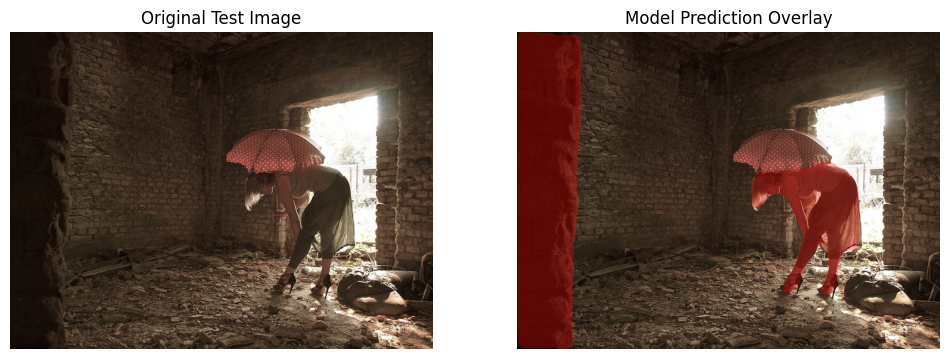

[11] 000000169356.jpg — detections: 8
Scores: [0.99273455 0.6395224  0.63718295 0.19654769 0.11317   ]


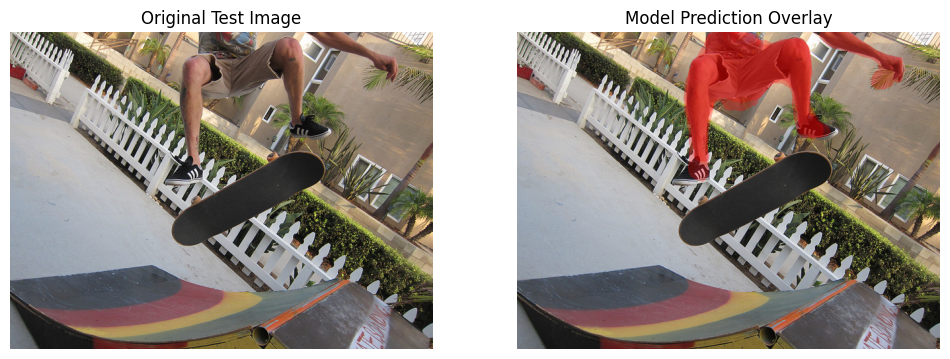

[12] 000000233771.jpg — detections: 24
Scores: [0.9914125  0.9891577  0.96199167 0.95289356 0.91013056]


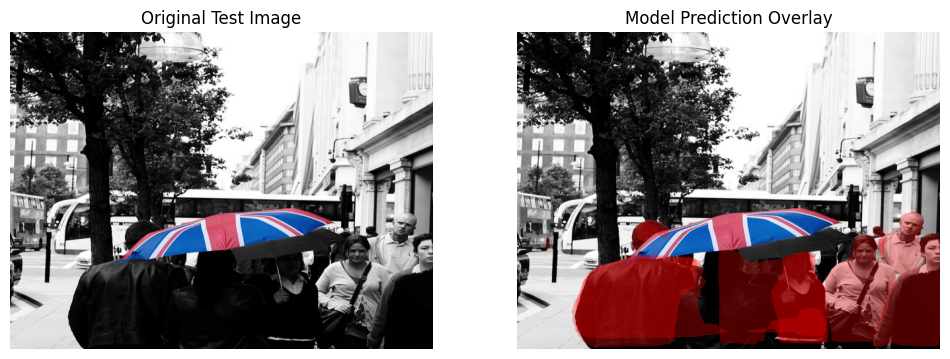

[13] 000000273711.jpg — detections: 13
Scores: [0.9965682  0.83072466 0.59753263 0.41578618 0.35851488]


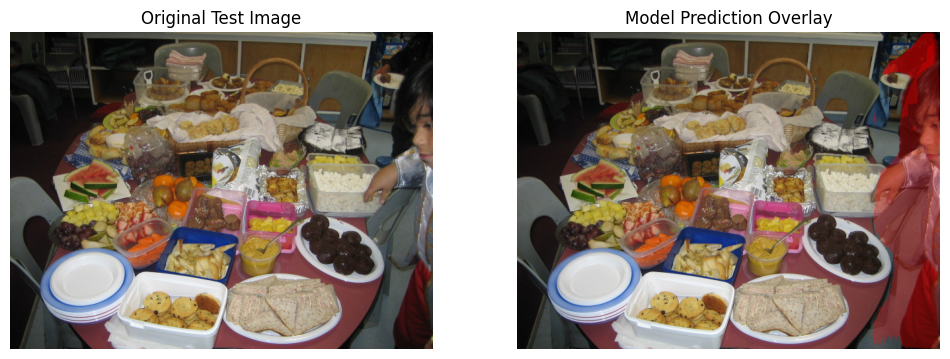

[14] 000000281409.jpg — detections: 28
Scores: [0.9937402  0.99272823 0.99252194 0.9911445  0.9905329 ]


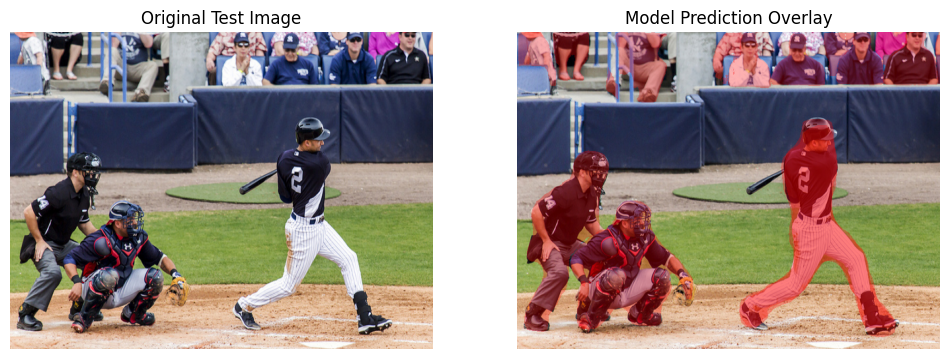

[15] 000000292415.jpg — detections: 4
Scores: [0.17821677 0.12471862 0.1221135  0.06648915]


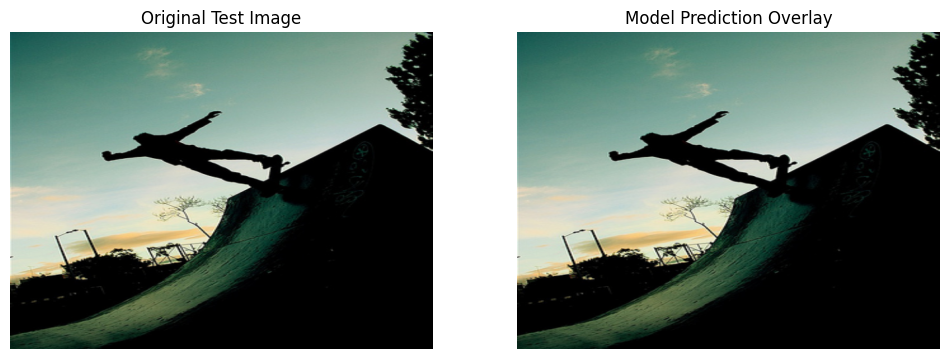

[16] 000000305317.jpg — detections: 58
Scores: [0.99025005 0.98992574 0.98427874 0.97669846 0.94175655]


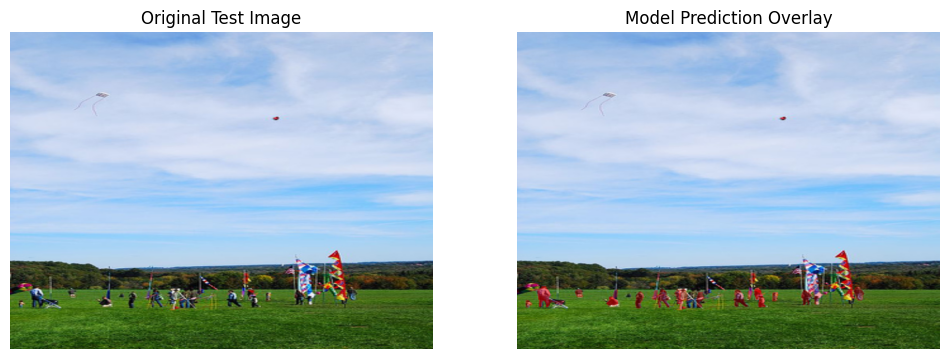

[17] 000000364297.jpg — detections: 11
Scores: [0.81664574 0.7567393  0.39282712 0.35481793 0.31522748]


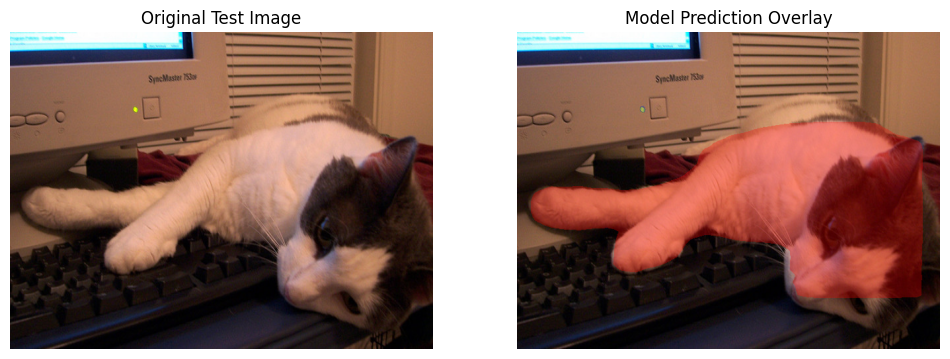

[18] 000000372349.jpg — detections: 4
Scores: [0.9945891  0.984404   0.12488344 0.09683403]


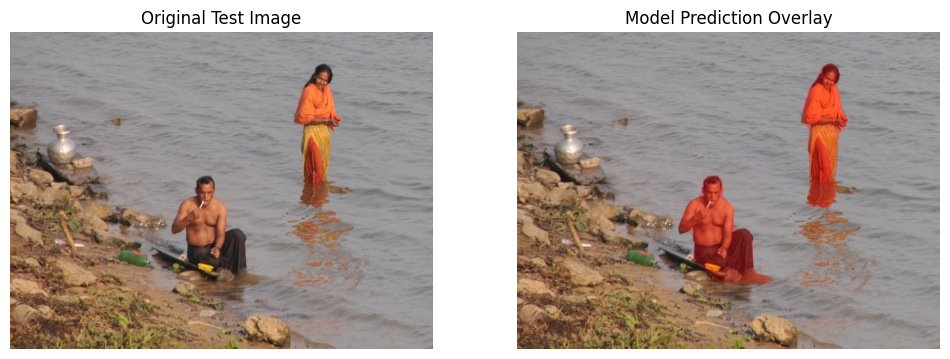

[19] 000000380913.jpg — detections: 15
Scores: [0.9961201  0.99234736 0.9916883  0.9905883  0.9837954 ]


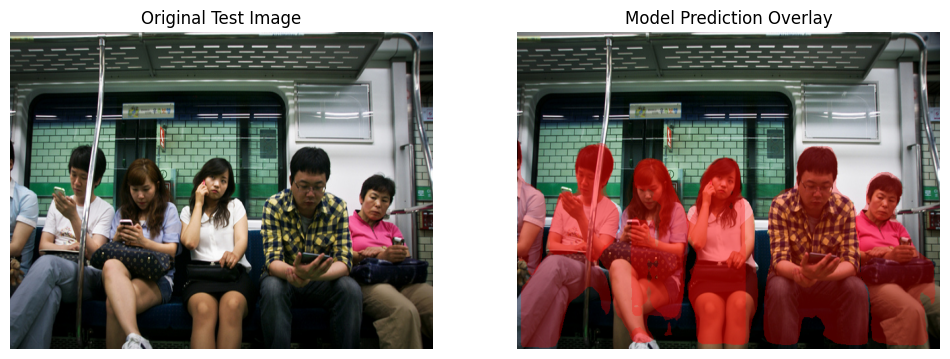

[20] 000000413552.jpg — detections: 13
Scores: [0.98118603 0.5391708  0.424965   0.3906918  0.28758413]


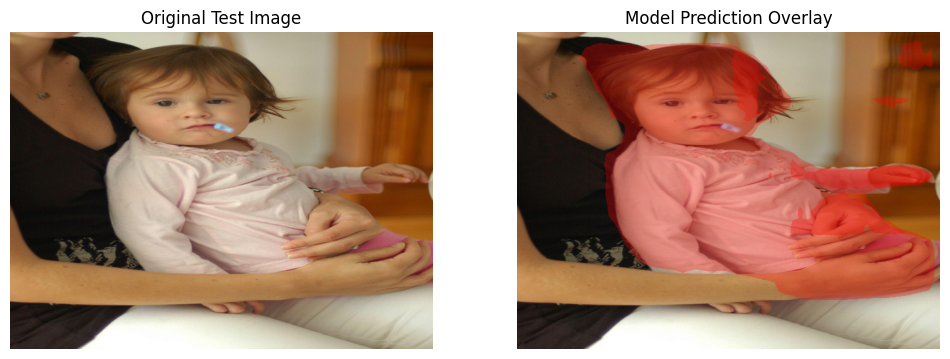

[21] 000000427655.jpg — detections: 17
Scores: [0.99533623 0.8640315  0.8391316  0.5040433  0.43006432]


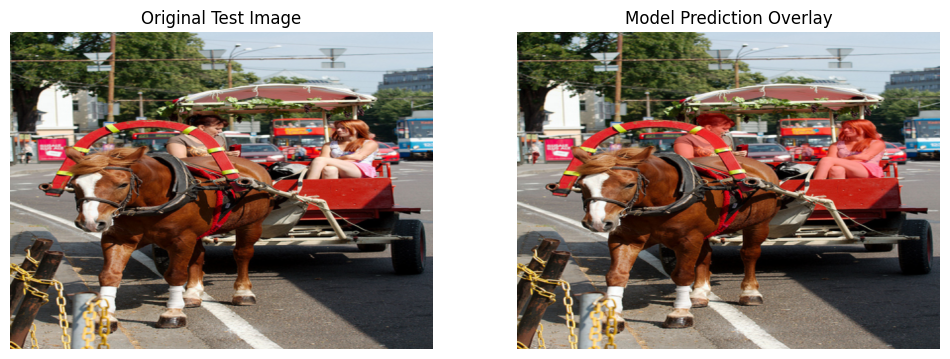

[22] 000000441442.jpg — detections: 7
Scores: [0.9755214  0.96587956 0.60262054 0.29205728 0.1573026 ]


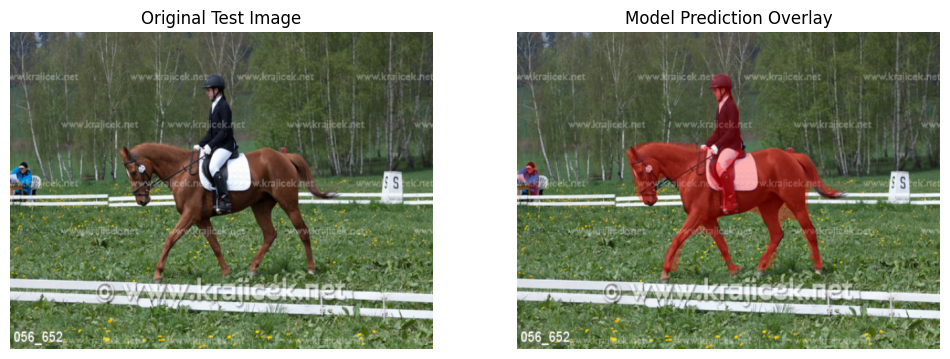

[23] 000000443844.jpg — detections: 3
Scores: [0.98157173 0.09132451 0.07516747]


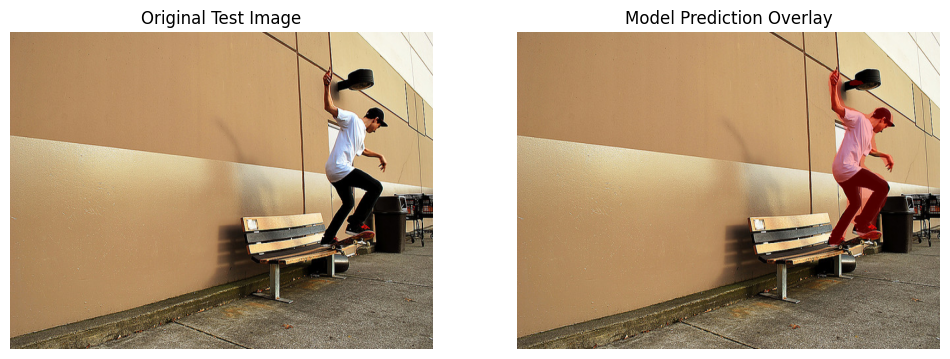

[24] 000000449579.jpg — detections: 3
Scores: [0.9844989  0.12440693 0.08233606]


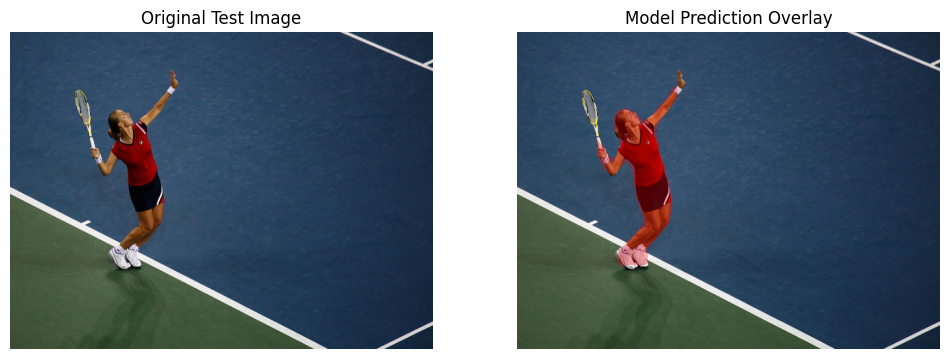

[25] 000000456496.jpg — detections: 13
Scores: [0.9922897  0.47706679 0.3847457  0.33417794 0.14231846]


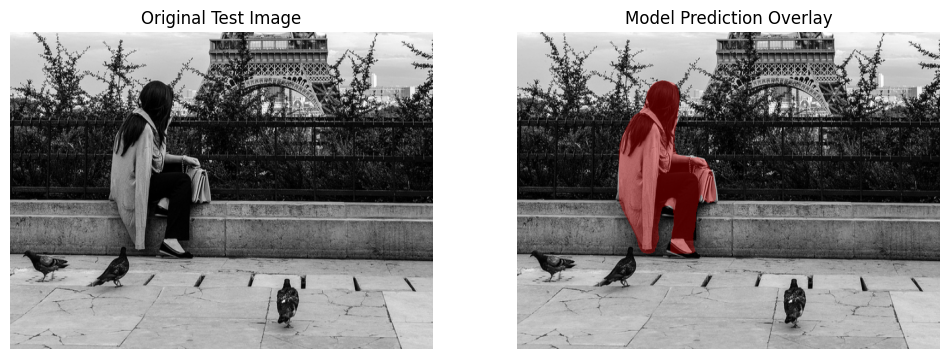

[26] 000000489305.jpg — detections: 6
Scores: [0.9219501  0.8686361  0.73462117 0.50156564 0.3985886 ]


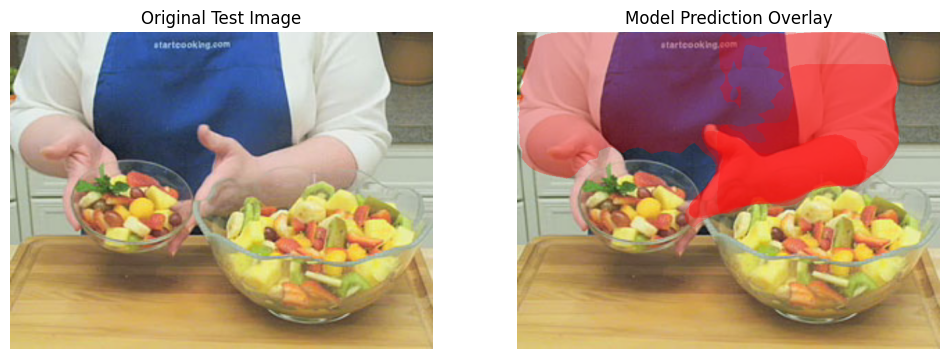

[27] 000000489764.jpg — detections: 40
Scores: [0.9853204  0.98505265 0.74369746 0.7001289  0.6450457 ]


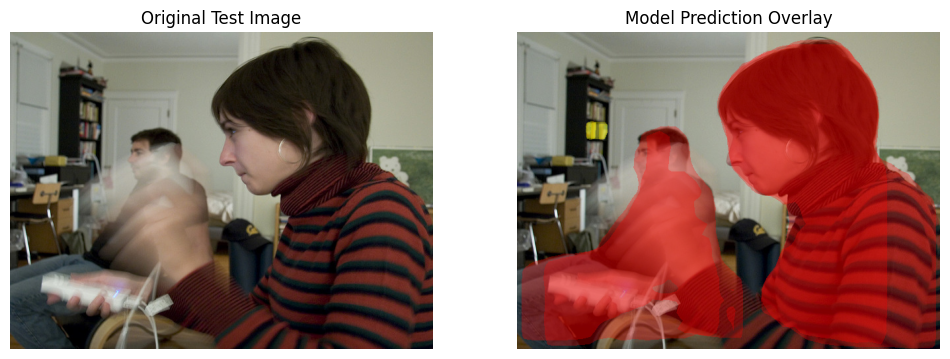

[28] 000000491366.jpg — detections: 5
Scores: [0.9774719  0.9750524  0.22026329 0.17616794 0.16069604]


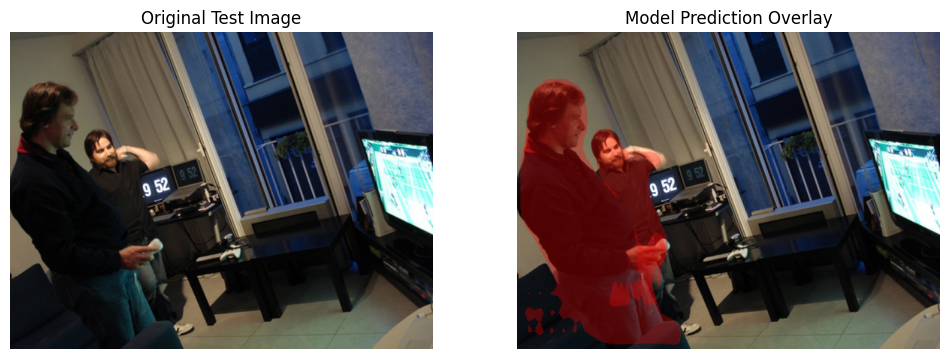

[29] 000000574297.jpg — detections: 6
Scores: [0.8370088  0.6935259  0.15607277 0.07098781 0.06749756]


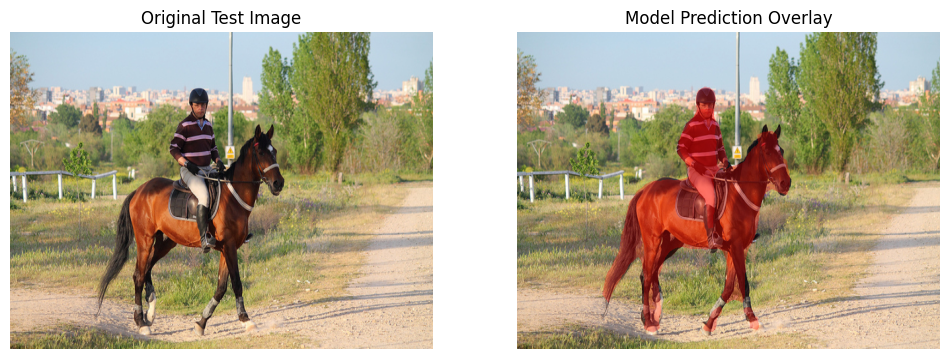

In [50]:
#  Test dataset (no labels) and predictions

class COCOTESTDataset(torch.utils.data.Dataset):
    def __init__(self, img_dir, resize=(480, 640)):
        self.img_dir = img_dir
        self.img_files = sorted([
            f for f in os.listdir(img_dir)
            if f.lower().endswith((".jpg", ".jpeg", ".png"))
        ])
        self.resize = resize

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_name = self.img_files[idx]
        img_path = os.path.join(self.img_dir, img_name)

        img = Image.open(img_path).convert("RGB")
        img = F.resize(img, self.resize)
        img_tensor = F.to_tensor(img)

        return img_tensor, img_name

TEST_IMG_DIR = TEST_DIR   # NOT TEST_DIR/data
test_dataset = COCOTESTDataset(TEST_IMG_DIR)
print("Test images:", len(test_dataset))


@torch.no_grad()
def visualize_test_image(model, dataset, device, idx=0, score_thresh=0.5, save_path=None):
    model.eval()

    img_tensor, img_name = dataset[idx]
    img_np = img_tensor.permute(1,2,0).numpy()

    output = model([img_tensor.to(device)])[0]

    masks  = output["masks"].cpu().numpy()
    labels = output["labels"].cpu().numpy()
    scores = output["scores"].cpu().numpy()

    print(f"[{idx}] {img_name} — detections: {len(masks)}")
    if len(scores) > 0:
        print("Scores:", scores[:5])

    overlay = img_np.copy()
    colours = {
        1: (1.0, 0.0, 0.0),
        2: (0.0, 1.0, 0.0),
        3: (0.0, 0.0, 1.0),
        4: (1.0, 1.0, 0.0),
    }

    for m, lab, sc in zip(masks, labels, scores):
        if sc < score_thresh:
            continue
        m_bin = m[0] > 0.5
        color = colours.get(int(lab), (1,1,1))
        for c in range(3):
            overlay[:,:,c] = np.where(
                m_bin,
                0.7*overlay[:,:,c] + 0.3*color[c],
                overlay[:,:,c]
            )

    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.imshow(img_np)
    plt.axis("off")
    plt.title("Original Test Image")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("Model Prediction Overlay")

    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches="tight")

    plt.show()


# Show at least 3 test images
visualize_test_image(model, test_dataset, device, idx=0)
visualize_test_image(model, test_dataset, device, idx=5)
visualize_test_image(model, test_dataset, device, idx=12)

# Save all test predictions
os.makedirs("test_predictions", exist_ok=True)
for i in range(len(test_dataset)):
    save_file = f"test_predictions/test_{i:02d}.png"
    visualize_test_image(model, test_dataset, device, idx=i, score_thresh=0.5, save_path=save_file)

In [53]:
# Analyse all test images and automatically pick 3 good ones

import numpy as np
import torch

model.eval()

all_results = []

score_threshold = 0.5  # you can change to 0.4 if too strict

for idx in range(len(test_dataset)):
    img_tensor, img_name = test_dataset[idx]

    with torch.no_grad():
        output = model([img_tensor.to(device)])[0]

    scores = output["scores"].cpu().numpy()
    labels = output["labels"].cpu().numpy()

    # Keep only detections above threshold
    keep = scores >= score_threshold
    scores_f = scores[keep]
    labels_f = labels[keep]

    num_det = len(scores_f)
    max_score = float(scores_f.max()) if num_det > 0 else 0.0

    # Check for rare classes: 3 = sports ball, 4 = book
    has_ball = 3 in labels_f
    has_book = 4 in labels_f

    all_results.append({
        "idx": idx,
        "name": img_name,
        "num_det": num_det,
        "max_score": max_score,
        "has_ball": has_ball,
        "has_book": has_book,
    })

print(f"Analysed {len(all_results)} test images.")

Analysed 30 test images.


In [54]:
# Pick strong example, rare example, and failure example

# 1) Strong example: max number of detections, then highest score
strong_example = max(
    all_results,
    key=lambda r: (r["num_det"], r["max_score"])
)

# 2) Rare example: image with sports ball or book
rare_candidates = [r for r in all_results if r["has_ball"] or r["has_book"]]
if len(rare_candidates) > 0:
    rare_example = max(rare_candidates, key=lambda r: (r["max_score"], r["num_det"]))
else:
    rare_example = None
    print("⚠️ No sports ball or book detected above threshold – will skip rare example.")

# 3) Failure example: 0 detections (or lowest confidence)
fail_candidates = [r for r in all_results if r["num_det"] == 0]
if len(fail_candidates) > 0:
    failure_example = fail_candidates[0]   # just take the first with 0 detections
else:
    # If every image has some detection, pick the one with lowest max_score
    failure_example = min(all_results, key=lambda r: r["max_score"])

print("\n=== Suggested images for report ===")
print(f"Strong example : idx={strong_example['idx']}, name={strong_example['name']}, "
      f"num_det={strong_example['num_det']}, max_score={strong_example['max_score']:.3f}")

if rare_example is not None:
    print(f"Rare example   : idx={rare_example['idx']}, name={rare_example['name']}, "
          f"num_det={rare_example['num_det']}, max_score={rare_example['max_score']:.3f}, "
          f"has_ball={rare_example['has_ball']}, has_book={rare_example['has_book']}")
else:
    print("Rare example   : None (no sports ball/book above threshold).")

print(f"Failure example: idx={failure_example['idx']}, name={failure_example['name']}, "
      f"num_det={failure_example['num_det']}, max_score={failure_example['max_score']:.3f}")


=== Suggested images for report ===
Strong example : idx=16, name=000000305317.jpg, num_det=21, max_score=0.990
Rare example   : idx=27, name=000000489764.jpg, num_det=7, max_score=0.985, has_ball=False, has_book=True
Failure example: idx=15, name=000000292415.jpg, num_det=0, max_score=0.000


[16] 000000305317.jpg — detections: 58
Scores: [0.99025005 0.98992574 0.98427874 0.97669846 0.94175655]


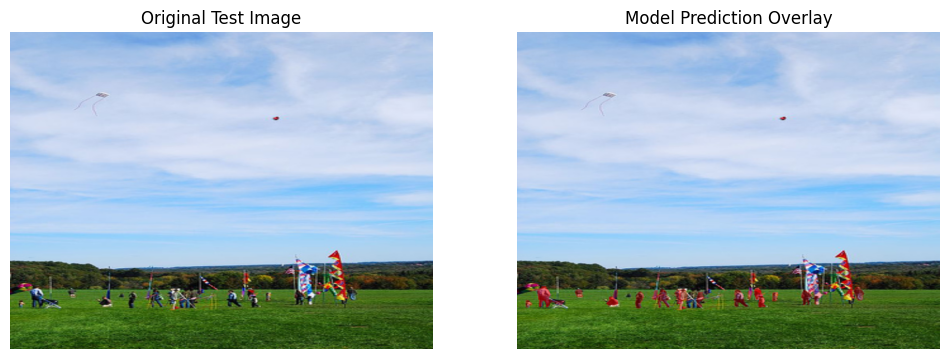

[27] 000000489764.jpg — detections: 40
Scores: [0.9853204  0.98505265 0.74369746 0.7001289  0.6450457 ]


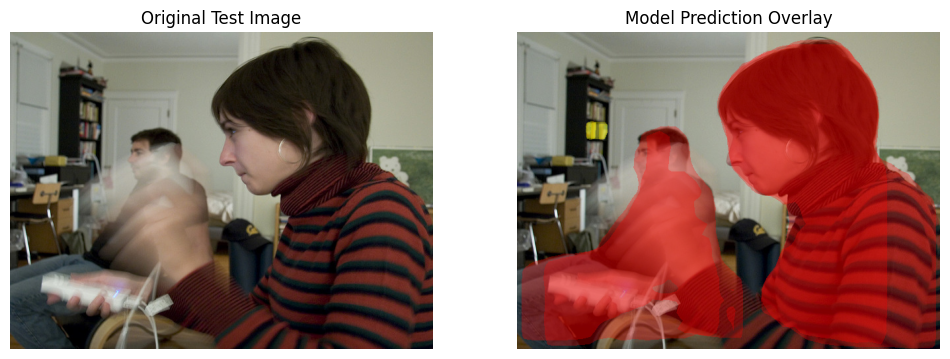

[15] 000000292415.jpg — detections: 4
Scores: [0.17821677 0.12471862 0.1221135  0.06648915]


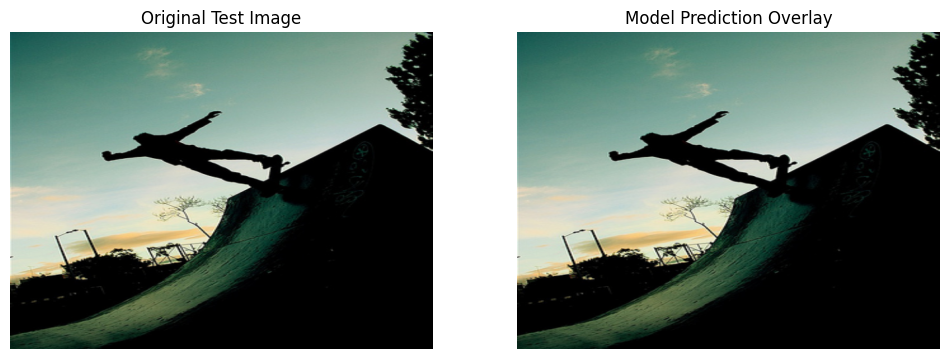

In [55]:
# Visualise the automatically chosen 3 images

# Strong (good performance)
visualize_test_image(
    model, test_dataset, device,
    idx=strong_example["idx"],
    score_thresh=0.5
)

# Rare category (sports ball / book) – if available
if rare_example is not None:
    visualize_test_image(
        model, test_dataset, device,
        idx=rare_example["idx"],
        score_thresh=0.5
    )

# Failure case
visualize_test_image(
    model, test_dataset, device,
    idx=failure_example["idx"],
    score_thresh=0.5
)